In [22]:
#!wget "http://users.sussex.ac.uk/~is321/training_images.npz" -O training_images.npz
!wget "https://sussex.box.com/shared/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz" -O training_images.npz

# The test images (without points)
#!wget "http://users.sussex.ac.uk/~is321/test_images.npz" -O test_images.npz
!wget "https://sussex.box.com/shared/static/xxlgvjpa86s6xgjzy5im06saoj57s7gt.npz" -O test_images.npz

# The example images are here
#!wget "http://users.sussex.ac.uk/~is321/examples.npz" -O examples.npz
!wget "https://sussex.box.com/shared/static/kbodelmaqw5dd59i5x2kis55lor7ydhf.npz" -O examples.npz

--2022-05-12 01:09:35--  https://sussex.box.com/shared/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz
Resolving sussex.box.com (sussex.box.com)... 185.235.236.197
Connecting to sussex.box.com (sussex.box.com)|185.235.236.197|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz [following]
--2022-05-12 01:09:35--  https://sussex.box.com/public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz
Reusing existing connection to sussex.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://sussex.app.box.com/public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz [following]
--2022-05-12 01:09:36--  https://sussex.app.box.com/public/static/jqrklxpl2c5hnrkpa2m7f9da2o3np8g9.npz
Resolving sussex.app.box.com (sussex.app.box.com)... 185.235.236.201
Connecting to sussex.app.box.com (sussex.app.box.com)|185.235.236.201|:443... connected.
HTTP request sent, awaiting response... 302 Found


In [23]:
def confirm_checksum(filename, true_checksum):
  import subprocess
  checksum = subprocess.check_output(['shasum',filename]).decode('utf-8')
  assert checksum.split(' ')[0] == true_checksum, 'Checksum does not match for ' + filename + ' redownload the data.'

confirm_checksum('training_images.npz', 'f313a54fc57a1235e6307d176fc5fc83fd7ec530')
confirm_checksum('test_images.npz', '4b9efd8eb3b87c07d9c5400ef2494d476bc318a3')
confirm_checksum('examples.npz', 'bf51ebbf42f17e3cbe06bb299746565c53d16c40')

In [26]:
import numpy as np
# Load the data using np.load
data = np.load('training_images.npz', allow_pickle=True)
# Extract the images
images = data['images']
# and the data points
pts = data['points']
test_data = np.load('test_images.npz', allow_pickle=True)
test_images = test_data['images']


In [27]:
#IMPORTS
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import urllib.request as urlreq
from scipy.signal import convolve2d
import matplotlib.pyplot as plt
from pylab import rcParams
from scipy.signal import convolve2d
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import urllib.request as urlreq
import os
import cv2 as cv
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import data, exposure
%matplotlib inline


#Pre-Processing Experimentation

Haar-Cascades

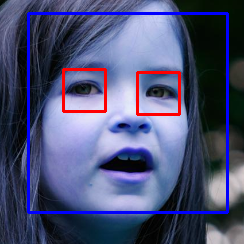

In [ ]:
#FACE DETECTION IN A PICTURE
#get image and turn it gray
oimg = images[5]
ogray_img = cv2.cvtColor(oimg, cv2.COLOR_BGR2GRAY)
#get a cascade classifier for the eyes and face from the xml files in haarcascades data
faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
eyeCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_eye_tree_eyeglasses.xml")
#create a face cascade that contains the points for the face box
faces= faceCascade.detectMultiScale (ogray_img,scaleFactor=1.1,minNeighbors =5)

#loop through the points in faces
for (x,y,w,h) in faces:
    #draw a rectangle in the place of the coords in face
  oimg = cv2.rectangle(oimg,(x,y), (x+w,y+h),(255,0,0),2)
  roi_gray = ogray_img[y:y+h, x:x+w]
  face_roi = oimg[y:y+h,x:x+w]
    #loop thought the points in eyes
  eyes = eyeCascade.detectMultiScale(roi_gray,minNeighbors =5)
  for (x2,y2,w2,h2) in eyes:
      #draws a rectange in the place of the coords of the eyes
    cv2.rectangle(face_roi,(x2,y2),(x2+w2,y2+h2),(0,0,255),2)
      

contours, hierarchy = cv2.findContours(ogray_img,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)[-2:]


cv2_imshow(oimg)

Canny Edge Detector

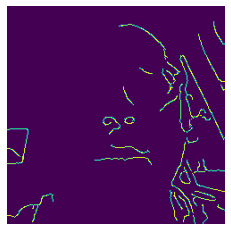

In [32]:
data = np.load('training_images.npz', allow_pickle=True)
test_data = np.load('test_images.npz', allow_pickle=True)
images = data['images']
t_images = test_data['images']
pts = data['points']
i = images[7]
#turn the image gray
newgray =cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
#perform a horizontal convolution
horz_grad = convolve2d(newgray,[[-1,0,1]], mode='same')
#perform a veritcal convolution
vert_grad = convolve2d(newgray,[[-1],[0],[1]])
#Smooth the image
smooth_img = cv2.GaussianBlur(newgray, (11,11), 2.0)
#Run a canny edge detetion on the smoothed image
im_canny = cv2.Canny(smooth_img,50,100)
plt.axis('off')
plt.imshow(im_canny)

plt.show()
#cv2_imshow(roi)

Brief Feature Detector

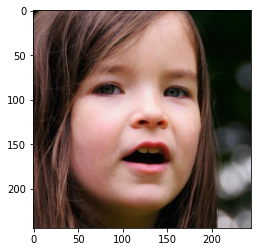

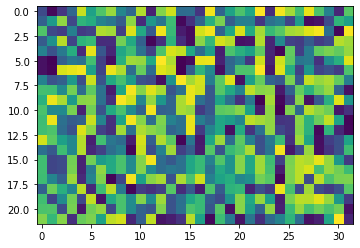

In [ ]:
#BRIEF FEATURE DETECTOR PRE-PROCESSING

import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = images[5]
plt.imshow(img)
plt.show()
# Initiate FAST detector
star = cv.xfeatures2d.StarDetector_create()
# Initiate BRIEF extractor
brief = cv.xfeatures2d.BriefDescriptorExtractor_create()
# find the keypoints with STAR
kp = star.detect(img,None)
# compute the descriptors with BRIEF
kp, des = brief.compute(img, kp)
plt.imshow(des)
plt.show()

ORB Feature

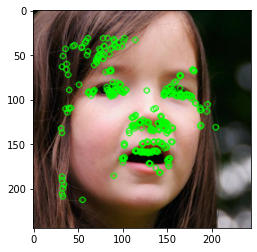

(<matplotlib.image.AxesImage at 0x7eff5c18ca10>, None)

In [ ]:
#ORB PRE-PROCESSING
img = images[5]
# Initiate ORB detector
orb = cv.ORB_create()
# find the keypoints with ORB
kp = orb.detect(img,None)
# compute the descriptors with ORB
kp, des = orb.compute(img, kp)
# draw only keypoints location,not size and orientation
img2 = cv.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
plt.imshow(img2), plt.show()

HOG Features

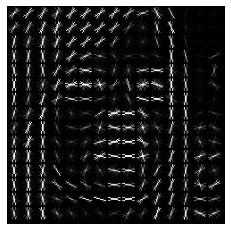

In [ ]:
image = images[5]
fd ,hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1), visualize=True)

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

plt.axis('off')
plt.imshow(hog_image_rescaled, cmap=plt.cm.gray)
#ax2.set_title('Histogram of Oriented Gradients')
plt.show()

#Regular Linear Regression

In [18]:
#convert all the images to grayscale
grey_img = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images])
#flatten all the gray images
passed_imgs = np.array([im.flatten() for im in grey_img])
#split the images into the testing and training set
training_images,testing_images ,train_pts, test_pts = train_test_split(passed_imgs,pts,test_size= 0.2)
#process the training images
im_train_processed = training_images.astype("float32")
#flatten the training points and process them
pts_train_flat = np.array([pt.flatten() for pt in train_pts])
pts_train_processed = pts_train_flat.astype("float32")


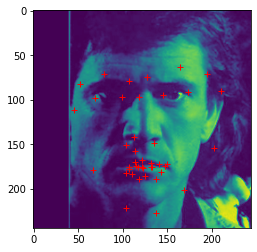

In [19]:

#create the Linear regression model
Lregression = LinearRegression()
#fit the model with the processed images and points
Lregression.fit(im_train_processed, pts_train_processed)
#flatten the image
testing_images1 = testing_images[0].reshape(1,-1)     
#predict the image points wiht the model
newpts= Lregression.predict(testing_images1)
newpts = newpts.reshape(42,2)
#plot the points
plt.plot(newpts[:,0],newpts[:,1],'+r')
plt.imshow(testing_images1.reshape(244,244))
plt.show()

#Canny Linear Regression


In [28]:
#Turn the image into a Canny image
grey_img = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images])
passed_imgs = np.array([im.flatten() for im in grey_img])
horizontal = np.array([convolve2d(i,[[-1,0,1]], mode='same') for i in grey_img])
vertical = np.array([convolve2d(j,[[-1],[0],[1]]) for j in grey_img])
canny_pics = np.array([cv2.GaussianBlur(k, (11,11), 2.0) for k in grey_img])
canny_pics = np.array([im.flatten() for im in canny_pics])
#split the data into testing and training
training_images,testing_images ,train_pts, test_pts = train_test_split(canny_pics,pts,test_size= 0.2)
#process the training images and points
im_train_processed = training_images.astype("float32")
pts_train_flat = np.array([pt.flatten() for pt in train_pts])
pts_train_processed = pts_train_flat.astype("float32")



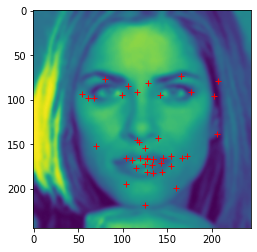

In [29]:
#create the model
CannyLregression = LinearRegression()
#fit the data
CannyLregression.fit(im_train_processed, pts_train_processed)
testing_images1 = testing_images[1].reshape(1,-1)     
#predict the testing images
Cannypts= CannyLregression.predict(testing_images1)
Cannypts = Cannypts.reshape(42,2)
#plot the points
plt.plot(Cannypts[:,0],Cannypts[:,1],'+r')
#show the image
plt.imshow(testing_images1.reshape(244,244))
plt.show()

#ORB Linear Regression


In [5]:
#takes in a set of images and creates an ORB image from it
def orb_images(images):
  orb_images =[]
  for img in images:
    orb = cv.ORB_create()
    kp = orb.detect(img,None)
    kp, des = orb.compute(img, kp)
    img2 = cv.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
    orb_images.append(img2)
  return np.array(orb_images)

In [6]:
#Pre-processing
#turns the images gray 
grey_img = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images])
#splits the data into training and testing
training_images,testing_images ,train_pts, test_pts = train_test_split(grey_img,pts,test_size= 0.2)
#process the training images
im_train_processed = training_images.astype("float32")
#flatten the training points and process them 
pts_train_flat = np.array([pt.flatten() for pt in train_pts])
pts_train_processed = pts_train_flat.astype("float32")

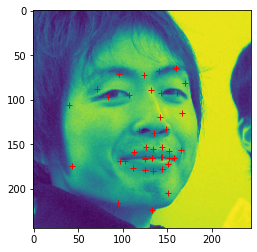

In [28]:
#create the model
OrbsLRegression= LinearRegression()
#turn all the data that will be fitted and make them into ORB images
pic_train  = orb_images(training_images)
pic_train = np.array([im.flatten() for im in pic_train])
#fit the training images and training points into the model
OrbsLRegression.fit(pic_train,pts_train_processed)
t_images = orb_images(testing_images)
testing_images1 = t_images[0].reshape(1,-1)    
testing =  testing_images[0].reshape(1,-1) 

#print(euclid_dist(pts,data['points']))
orbpts= OrbsLRegression.predict(testing_images1)
orbpts = orbpts.reshape(42,2)
plt.plot(orbpts[:,0],orbpts[:,1],'+r')
plt.imshow(testing.reshape(244,244))
plt.show()

#HOG Linear Regression

In [28]:
def hog_images(images):
  hog_images =[]
  for img in images:
    hog_ori =  hog(img,multichannel=False)
    hog_images.append(hog_ori)
  return np.array(hog_images)

In [29]:
#turns the images gray 
grey_img = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images])
#splits the data into training and testing
training_images,testing_images ,train_pts, test_pts = train_test_split(grey_img,pts,test_size= 0.2)
#process the training images
im_train_processed = training_images.astype("float32")
#flatten the training points and process them 
pts_train_flat = np.array([pt.flatten() for pt in train_pts])
pts_train_processed = pts_train_flat.astype("float32")


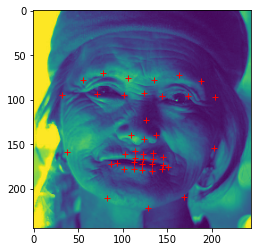

In [30]:
#load data and process were going to predict
test_images = test_data['images']
grey_img = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in test_images])
#create the model
HogsLRegression= LinearRegression()
#turn all the data that will be fitted and make them into ORB images
pic_train  = hog_images(training_images)
#fit the training images and training points into the model
HogsLRegression.fit(pic_train,pts_train_processed)

t_images = hog_images(grey_img)
testing_images1 = t_images[0].reshape(1,-1)    
testing =  testing_images[0].reshape(1,-1) 


#print(euclid_dist(pts,data['points']))
Hogpts= HogsLRegression.predict(testing_images1)
Hogpts = Hogpts.reshape(42,2)
plt.plot(Hogpts[:,0],Hogpts[:,1],'+r')
plt.imshow(testing.reshape(244,244))
plt.show()

#Lip Modification

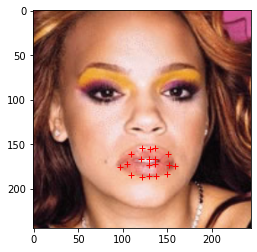

[array([ 97.3450662 , 175.07820722]), array([109.24162806, 160.49691058]), array([121.05430874, 153.81419753]), array([130.19905586, 155.44640319]), array([136.28861032, 153.85667651]), array([150.48448231, 160.76979708]), array([158.92457061, 173.91448593]), array([149.95998973, 183.24708387]), array([137.63702562, 185.51932861]), array([129.68479692, 185.74585082]), array([121.329396  , 185.97814965]), array([109.74945958, 184.14247003]), array([105.3015063 , 172.35621365]), array([121.00534822, 166.42345664]), array([129.73322599, 166.82967883]), array([136.58005059, 166.76416409]), array([151.48363136, 172.64287082]), array([136.60132685, 172.28018497]), array([129.89026627, 173.55234402])]


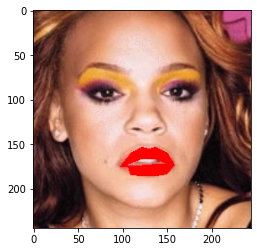

In [25]:
data = np.load('training_images.npz', allow_pickle=True)
images = data['images']
pts = data['points']
def visualise_pts(img, pts):
  import matplotlib.pyplot as plt
  plt.imshow(img)
  #plot mouth points
  plt.plot(pts[22:41, 0], pts[22:41, 1], '+r')
  mouth = []
  for p in pts[22:41]:
    mouth.append(p)

  plt.show(mouth)

  print(mouth)
  #fill the mouth points with the colour red
  cv2.fillPoly(img, pts = np.int32(np.array([mouth])),color=(255,0,0))
  plt.imshow(img)
  plt.show()

for i in range(1):
  idx = np.random.randint(0, images.shape[0])
  visualise_pts(images[idx, ...], pts[idx, ...])


#Results

In [9]:
def euclid_dist(pred_pts, gt_pts):
  """
  Calculate the euclidean distance between pairs of points
  :param pred_pts: The predicted points
  :param gt_pts: The ground truth points
  :return: An array of shape (no_points,) containing the distance of each predicted point from the ground truth
  """
  import numpy as np
  pred_pts = np.reshape(pred_pts, (-1, 2))
  gt_pts = np.reshape(gt_pts, (-1, 2))
  return np.sqrt(np.sum(np.square(pred_pts - gt_pts), axis=-1))

In [31]:
def save_as_csv(points, location = '.'):
    """
    Save the points out as a .csv file
    :param points: numpy array of shape (no_test_images, no_points, 2) to be saved
    :param location: Directory to save results.csv in. Default to current working directory
    """
    assert points.shape[0]==554, 'wrong number of image points, should be 554 test images'
    assert np.prod(points.shape[1:])==2*42, 'wrong number of points provided. There should be 42 points with 2 values (x,y) per point'
    np.savetxt(location + '/results.csv', np.reshape(points, (points.shape[0], -1)), delimiter=',')


In [ ]:
def vis_pts(img,pts):
  import matplotlib.pyplot as plt
  plt.imshow(img)
  plt.plot(pts[:,0],pts[:,1],'+r')
  plt.show()
#for i in range(1):
  #idx = np.random.randint(0,images.shape[0])
  #vis_pts(images[idx,...],pts[idx,...])









In [53]:
ts = []
for i in range(len(test_images)):
  testing_images1 = t_images[i].reshape(1,-1) 
  newpts= HogsLRegression.predict(testing_images1)
  newpts = newpts.reshape(42,2)
  ts.append(newpts)
ts = np.array(ts)


In [50]:
ts= []

In [56]:
save_as_csv(ts)

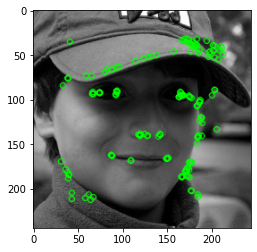

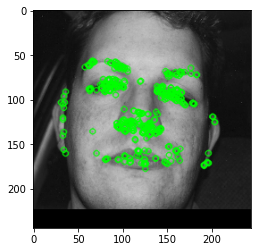

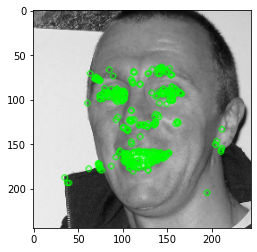

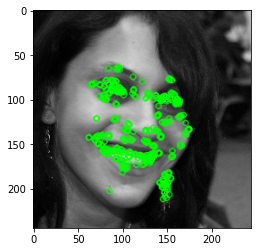

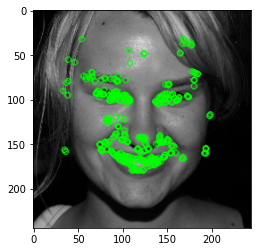

...

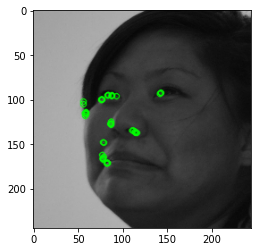

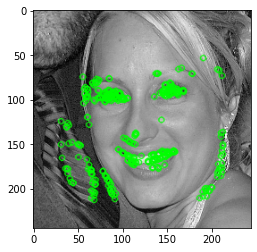

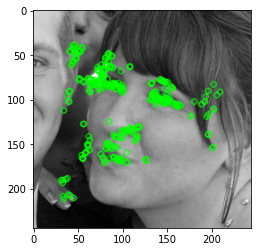

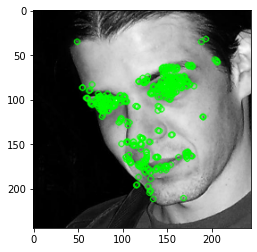

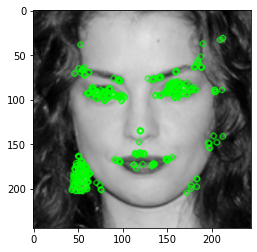

KeyboardInterrupt: ignored

In [16]:
# Model

def calc_allpointsHog(model):
  error =[]

  for i in range(len(testing_images)):
    testing_images1 = t_images[i].reshape(1,-1) 
    newpts= model.predict(testing_images1)
    newpts = newpts.reshape(42,2)
    error.append(np.mean(euclid_dist(newpts,test_pts[i])))
  print("max:"+ str(max(error)))
  print("min:"+ str(min(error)))
  return np.mean(error)
def calc_allpointsORB(model):
  error =[]
  for i in range(len(testing_images)):
    testing_images1 = t_images[i].reshape(1,-1) 
    newpts= model.predict(testing_images1)
    newpts = newpts.reshape(42,2)
    error.append(np.mean(euclid_dist(newpts,test_pts[i])))
  print("max:"+ str(max(error)))
  print("min:"+ str(min(error)))
  return np.mean(error)  

def calc_allpoints(model):
  error =[]

  for i in range(len(testing_images)):
    testing_images1 = testing_images[i].reshape(1,-1) 
    newpts= model.predict(testing_images1)
    newpts = newpts.reshape(42,2)
    error.append(np.mean(euclid_dist(newpts,test_pts[i])))
  print("max:"+ str(max(error)))
  print("min:"+ str(min(error)))
  return np.mean(error)

print("average:"+str(calc_allpointsORB(OrbsLRegression)))
#print(calc_allpoints(Lregression))
#print(calc_allpoints(CannyLregression))


Text(0, 0.5, 'Average Error')

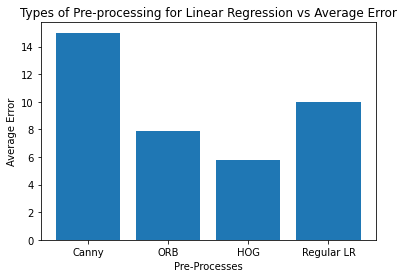

In [12]:
names = ['Canny','ORB','HOG','Regular LR']
results =[15,7.9,5.8,10]
plt.bar(names,results)
plt.title('Types of Pre-processing for Linear Regression vs Average Error')
plt.xlabel('Pre-Processes')
plt.ylabel('Average Error')

Text(0, 0.5, 'Minimum Error')

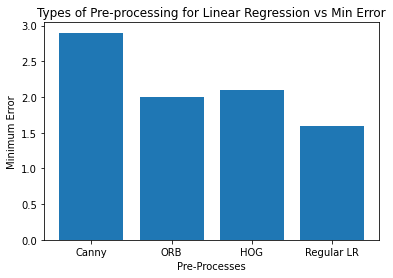

In [13]:
names = ['Canny','ORB','HOG','Regular LR']
results =[2.9,2.0,2.1,1.6]
plt.bar(names,results)
plt.title('Types of Pre-processing for Linear Regression vs Min Error')
plt.xlabel('Pre-Processes')
plt.ylabel('Minimum Error')

Text(0, 0.5, 'Maximum Error')

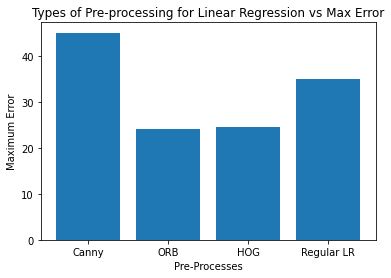

In [14]:
names = ['Canny','ORB','HOG','Regular LR']
results =[45.1,24.2,24.5,35]
plt.bar(names,results)
plt.title('Types of Pre-processing for Linear Regression vs Max Error')
plt.xlabel('Pre-Processes')
plt.ylabel('Maximum Error')